In [2]:
from IPython.core.display import display, HTML

html_code = """
<html>
    <head>
        <style>
            body {
                font-family: Arial, sans-serif;
                text-align: center;
                line-height: 1.6;
                background-color: white;
                color: black;
            }
            h1, h2, h3, p {
                color: black;  /* Set text color to black */
            }
            h1 {
                font-size: 28px;
                font-weight: bold;
                margin-top: 50px;
            }
            h2, h3, p {
                font-size: 18px;
                font-weight: normal;
            }
            .spacer {
                margin: 30px 0;
            }
            .name-container {
                display: flex;
                justify-content: center;
                gap: 20px;
                margin-top: 20px;
            }
            .name-block {
                text-align: center;
            }
        </style>
    </head>
    <body>
        <h1>AD HOC AND WIRELESS NETWORKS<br>PRACTICAL FILE</h1>
        <div class="spacer"></div>
        <h2>Submitted</h2>
        <p>In partial fulfillment of the requirement for the degree of</p>
        <h3>Bachelor of Technology<br>In<br>Computer Science and Engineering</h3>
        <div class="spacer"></div>

        <div class="name-container">
            <div class="name-block">
                <h2>Akanksha Joshi<br>210050101005</h2>
            </div>
            <div class="name-block">
                <h2>Mitali Suyal<br>210050101040</h2>
            </div>
            <div class="name-block">
                <h2>Sakshi Tiwari<br>210050101048</h2>
            </div>
            <div class="name-block">
                <h2>Simran Bisht<br>210050101055</h2>
            </div>
        </div>

        <div class="spacer"></div>
        <p>Submitted To:<br>Mr. Manish Bhatt</p>
        <a href="https://imgbb.com/"><img src="https://i.ibb.co/zxBTD6K/Picture1.png" alt="Picture1" border="0"></a>
        <div class="spacer"></div>
        <p>DEPARTMENT OF COMPUTER SCIENCE AND ENGINEERING<br>
           BIRLA INSTITUTE OF APPLIED SCIENCES, BHIMTAL<br>
           NAINITAL-263136, UTTARAKHAND, INDIA
        </p>
    </body>
</html>
"""

display(HTML(html_code))

# Ad-Hoc Survey Data Analysis

The ad hoc survey data analysis project focuses on evaluating mobile signal strength across different models, manufacturers, and service providers at various locations.


### Data Cleaning and Preprocessing

Data cleaning and preprocessing is the crucial first step in data analysis, ensuring the dataset is accurate and ready for analysis. It involves handling missing values, outliers, and duplicate data to maintain data integrity. This step also includes normalizing or scaling data to bring it into a comparable range. Encoding categorical variables and transforming data types are part of this process to ensure compatibility with analytical models. Proper preprocessing enhances the reliability and efficiency of subsequent data analysis and modeling steps.

1. Importing our dataset

In [3]:
import numpy as np
import pandas as pd

file_path = 'drive/MyDrive/Ad Hoc Survey Data Collection Form (Responses) - Form Responses 1.csv'
data = pd.read_csv(file_path)

data.head(20)

,Timestamp,Name,Roll Number,Manufacturer/Parent Company of your Mobile,"Model Name (ex: Note 7, Iphone 15)",Service Provider 1,Service Provider 2,Signal Strength for Place 1,ASU for place 1,Geolocation of place 1,...,Geolocation of place 11,Signal Strength for Place 12,ASU for place 12,Geolocation of place 12,Signal Strength for Place 13,ASU for place 13,Geolocation of place 13,Signal Strength for Place 14,ASU for place 14,Geolocation of place 14
0,10/22/2024 16:06:10,Sambhav Gupta,210050101049,OnePlus,Nord CE3 Lite,Airtel,NaN,-105,35,29°21′28″ N 79°33′7″ E,...,29°21′26″ N 79°33′11″ E,-89,51,29°21′30″ N 79°33′11″ E,-93,47,29°21′30″ N 79°33′11″ E,-77,64,29°21′28″ N 79°33′9″ E
1,10/22/2024 16:07:29,Devashish Dixit,210050101018,Apple,Iphone 13,Airtel,NaN,-111,29,29°21′28″ N 79°33′7″ E,...,29°21′26″ N 79°33′11″ E,-87,53,29°21′30″ N 79°33′11″ E,-91,49,29°21′30″ N 79°33′11″ E,-84,56,29°21′28″ N 79°33′9″ E
2,10/22/2024 16:14:51,Priyanshi Kandpal,210050101044,Redmi,Note 9 pro,Vodafone IN,NaN,-83,15,"29°21'28""N 79°33'11""E",...,"29°21'25""N 79°33'10""E",-98,42,"29°21'28""N 79°33'11""E",-111,29,"29°21'32""N 79°33'11""E",-93,46,"29°21'25""N 79°33'7""E"
3,10/22/2024 16:14:57,Mayank Pant,210050101038,Realme,RMX3471,Airtel,NaN,-105,39,"29°21'34""N 79°33'3""E",...,"29°21'28""N 79°33'7""E",-96,44,"29°21'30""N 79°33'11""E",-91,41,"29°21'26""N 79°33'10""E",-75,65,"29°21'28""N 79°33'9""E"
4,10/22/2024 16:16:08,Gunjan Jeena,210050101024,Samsung,M34 5G,jio,NaN,-105,39,29°21′34″ N 79°33′3″ E,...,29°21′28″ N 79°33′7″ E,-96,44,29°21′30″ N 79°33′10″ E,-91,41,29°21′26″ N 79°33′10″ E,-75,65,29°21′28″ N 79°33′9″ E
5,10/22/2024 17:09:53,Avantika joshi,210050101011,Apple,Iphone 12,JIO,NaN,-105,39,29°21′31″ N 79°33′7″ E,...,29°21′29″ N 79°33′12″ E,-91,41,29°21′32″ N 79°33′11″ E,-75,65,29°21′28″ N 79°33′9″ E,-87,47,29°21′21″ N 79°33′7″ E
6,10/22/2024 17:11:33,Akanksha Joshi,210050101005,Samsung,M32,Jio,Bsnl,-111,89,29°21′25″ N 79°33′7″ E,...,29°21′25″ N 79°33′10″ E,-71,69,29°21′28″ N 79°33′11″ E,-83,57,29°21′30″ N 79°33′11″ E,-83,57,29°21′29″ N 79°33′9″ E
7,10/22/2024 17:14:31,Daksh Joshi,210050101015,Apple,iPhone 13 pro,Jio,NaN,98,42,29°21'25''N 79°31'7''E,...,29°21'29''N 79°33'12''E,91,49,29°21'31''N 79°33'12''E,86,44,29°21'33''N 79°33'11'E,78,62,29°21'28''N 79°33'9''
8,10/22/2024 17:21:59,Aman Bhatt,210050101007,"OnePlus Technology (Shenzhen) Co., Ltd.",OnePlus Nord CE 2 Lite 5G,JIO,NaN,-97dBm,43asu,"29°21'27""N 79°33'6""E",...,"29°21'28""N 79°33'11""E",-90dBm,50asu,"29°21'30""N 79°33'11""E",-90dBm,50asu,"29°21'31""N 79°33'11""E",-85dBm,55asu,"29°21'28""N 79°33'8""E"
9,10/22/2024 17:43:55,Deepak Phartyal,720050101001,Nothing,CMF PHONE ONE,Airtel,NoN,100,41,29°21′25″ N 79°33′7″ E,...,29°21′25″ N 79°33′7″ E,92,48,29°21′31″ N 79°33′11″ E,90,50,29°21′32″ N 79°33′10″ E,78,62,29°21′26″ N 79°33′7″ E


1.2 Renaming the columns to ensure a consistent data format

In [4]:
data.columns = data.columns.str.strip().str.lower().str.replace(' ', '_').str.replace('/', '_')

In [5]:
data = data.rename(columns={'model_name_(ex:_note_7,_iphone_15)': 'model_name'})

1.3 Dropping unnecessary data columns: Here, we do not need the timestamp, name or roll_number as they are irrelevant to our study.

In [6]:
columns_to_drop = ['timestamp', 'name', 'roll_number']
if columns_to_drop:
    data = data.drop(columns=columns_to_drop)

1.4 Cleaning string values to have all our data in lowercase without trailing whitespaces

In [7]:
for column in data.columns:
    if data[column].dtype == 'object':
        data[column] = data[column].str.strip().str.lower()

data.head(20)

,manufacturer_parent_company_of_your_mobile,model_name,service_provider_1,service_provider_2,signal_strength_for_place_1,asu_for_place_1,geolocation_of_place_1,signal_strength_for_place_2,asu_for_place_2,geolocation_of_place_2,...,geolocation_of_place_11,signal_strength_for_place_12,asu_for_place_12,geolocation_of_place_12,signal_strength_for_place_13,asu_for_place_13,geolocation_of_place_13,signal_strength_for_place_14,asu_for_place_14,geolocation_of_place_14
0,oneplus,nord ce3 lite,airtel,NaN,-105,35,29°21′28″ n 79°33′7″ e,-87,53,29°21′26″ n 79°33′7″ e,...,29°21′26″ n 79°33′11″ e,-89,51,29°21′30″ n 79°33′11″ e,-93,47,29°21′30″ n 79°33′11″ e,-77,64,29°21′28″ n 79°33′9″ e
1,apple,iphone 13,airtel,NaN,-111,29,29°21′28″ n 79°33′7″ e,-94,46,29°21′26″ n 79°33′7″ e,...,29°21′26″ n 79°33′11″ e,-87,53,29°21′30″ n 79°33′11″ e,-91,49,29°21′30″ n 79°33′11″ e,-84,56,29°21′28″ n 79°33′9″ e
2,redmi,note 9 pro,vodafone in,NaN,-83,15,"29°21'28""n 79°33'11""e",-114,26,"29°21'26""n 79°33'6""e",...,"29°21'25""n 79°33'10""e",-98,42,"29°21'28""n 79°33'11""e",-111,29,"29°21'32""n 79°33'11""e",-93,46,"29°21'25""n 79°33'7""e"
3,realme,rmx3471,airtel,NaN,-105,39,"29°21'34""n 79°33'3""e",-92,42,"29°21'26""n 79°33'7""e",...,"29°21'28""n 79°33'7""e",-96,44,"29°21'30""n 79°33'11""e",-91,41,"29°21'26""n 79°33'10""e",-75,65,"29°21'28""n 79°33'9""e"
4,samsung,m34 5g,jio,NaN,-105,39,29°21′34″ n 79°33′3″ e,-92,42,29°21′26″ n 79°33′7″ e,...,29°21′28″ n 79°33′7″ e,-96,44,29°21′30″ n 79°33′10″ e,-91,41,29°21′26″ n 79°33′10″ e,-75,65,29°21′28″ n 79°33′9″ e
5,apple,iphone 12,jio,NaN,-105,39,29°21′31″ n 79°33′7″ e,-92,42,29°21′26″ n 79°33′7″ e,...,29°21′29″ n 79°33′12″ e,-91,41,29°21′32″ n 79°33′11″ e,-75,65,29°21′28″ n 79°33′9″ e,-87,47,29°21′21″ n 79°33′7″ e
6,samsung,m32,jio,bsnl,-111,89,29°21′25″ n 79°33′7″ e,-78,61,29°21′26″ n 79°33′7″ e,...,29°21′25″ n 79°33′10″ e,-71,69,29°21′28″ n 79°33′11″ e,-83,57,29°21′30″ n 79°33′11″ e,-83,57,29°21′29″ n 79°33′9″ e
7,apple,iphone 13 pro,jio,NaN,98,42,29°21'25''n 79°31'7''e,90,57,29°21'26''n 79°33'7''e,...,29°21'29''n 79°33'12''e,91,49,29°21'31''n 79°33'12''e,86,44,29°21'33''n 79°33'11'e,78,62,29°21'28''n 79°33'9''
8,"oneplus technology (shenzhen) co., ltd.",oneplus nord ce 2 lite 5g,jio,NaN,-97dbm,43asu,"29°21'27""n 79°33'6""e",-95dbm,45asu,"29°21'26""n 79°33'6""e",...,"29°21'28""n 79°33'11""e",-90dbm,50asu,"29°21'30""n 79°33'11""e",-90dbm,50asu,"29°21'31""n 79°33'11""e",-85dbm,55asu,"29°21'28""n 79°33'8""e"
9,nothing,cmf phone one,airtel,non,100,41,29°21′25″ n 79°33′7″ e,83,56,29°21′26″ n 79°33′7″ e,...,29°21′25″ n 79°33′7″ e,92,48,29°21′31″ n 79°33′11″ e,90,50,29°21′32″ n 79°33′10″ e,78,62,29°21′26″ n 79°33′7″ e


1.5 Checking for unique data entries for further preprocessing

In [8]:
for column in data.columns[:6]:
    if data[column].dtype == 'object':
        print(f"Column: {column}")
        print(data[column].unique())

Column: manufacturer_parent_company_of_your_mobile
['oneplus' 'apple' 'redmi' 'realme' 'samsung'
 'oneplus technology (shenzhen) co., ltd.' 'nothing' 'motorola mobility'
 'poco' 'vivo' 'xiaomi' 'mi' 'oppo' 'iqoo' 'infinix' 'motorola']
Column: model_name
['nord ce3 lite' 'iphone 13' 'note 9 pro' 'rmx3471' 'm34 5g' 'iphone 12'
 'm32' 'iphone 13 pro' 'oneplus nord ce 2 lite 5g' 'cmf phone one'
 'motorola g 85' 'm2 pro' 'y15' 'galaxy a54' 'samsung m34'
 'nord ce4 lite 5g' 'g73 5g' 'y16' 'galaxy m31' 'note 10 pro'
 'redmi note10s' 'iphone 14 plus' 'redmi note 8 pro' 'narzo 30' 'a17k'
 'galaxy a14 5g' 'redmi note 10 pro' 'galaxy m14 5g' 'oppo a55' 'f41'
 'z6 pro' 'hot 10s' 'galaxy f13' 'galaxy a10' '8i' 's24 ultra' 'rmx2151'
 's23 ultra' 'z7' 'redmi note 12' 'note 20' 'redmi 10a' 's20 fe'
 'g40 fusion' 'galaxy a52s 5g' 'neo 7' 'm4 pro' 'motorolo g54'
 'm2 reloaded' 'oneplus nord ce 3 lite' 'a73' 'oppo a54' 'x4 pro 5g'
 'note 9' 'nord ce 3' 'a5 2020' 'narzo 70' 'm2' 'narzo 50a' 's22']
Column:

1.6 Resolving inconsisent naming and column data types

In [9]:
# 1. Clean 'manufacturer_parent_company_of_your_mobile'
data['manufacturer_parent_company_of_your_mobile'] = data['manufacturer_parent_company_of_your_mobile'].replace({
    'oneplus technology (shenzhen) co., ltd.': 'oneplus',
    'motorola mobility': 'motorola',
    'mi': 'xiaomi'
})

# 2. Clean 'model_name_(ex:_note_7,_iphone_15)'
data['model_name'] = data['model_name'].str.replace('_', ' ', regex=False)
model_corrections = {
    'note10s': 'note 10s',
    'note10 pro': 'note 10 pro',
    'm34': 'galaxy m34'
}
data['model_name'] = data['model_name'].replace(model_corrections)

# 3. Clean 'service_provider_1'
data['service_provider_1'] = data['service_provider_1'].replace({
    'vodafone in': 'vi', 'vi india': 'vi', 'vodafone': 'vi'
})

# 4. Clean 'service_provider_2'
data['service_provider_2'] = data['service_provider_2'].replace({
    'airtal': 'airtel', 'vodafone': 'vi', 'non': np.nan, 'n/n': np.nan, '-': np.nan, 'nothing': np.nan, 'nan': np.nan
})

for i in range(1, 15):
    # Process signal strength columns
    data['signal_strength_for_place_' + str(i)] = data['signal_strength_for_place_' + str(i)].replace({'-': np.nan})
    data['signal_strength_for_place_' + str(i)] = data['signal_strength_for_place_' + str(i)].astype(str).str.extract(r'(-?\d+)', expand=False).astype(float)
    data['signal_strength_for_place_' + str(i)] = -data['signal_strength_for_place_' + str(i)].abs()  # Convert all to negative

    # Process ASU columns
    data['asu_for_place_' + str(i)] = data['asu_for_place_' + str(i)].replace({'-': np.nan})
    data['asu_for_place_' + str(i)] = data['asu_for_place_' + str(i)].astype(str).str.extract(r'(\d+)', expand=False).astype(float)

data.head(10)

,manufacturer_parent_company_of_your_mobile,model_name,service_provider_1,service_provider_2,signal_strength_for_place_1,asu_for_place_1,geolocation_of_place_1,signal_strength_for_place_2,asu_for_place_2,geolocation_of_place_2,...,geolocation_of_place_11,signal_strength_for_place_12,asu_for_place_12,geolocation_of_place_12,signal_strength_for_place_13,asu_for_place_13,geolocation_of_place_13,signal_strength_for_place_14,asu_for_place_14,geolocation_of_place_14
0,oneplus,nord ce3 lite,airtel,NaN,-105.0,35.0,29°21′28″ n 79°33′7″ e,-87.0,53.0,29°21′26″ n 79°33′7″ e,...,29°21′26″ n 79°33′11″ e,-89.0,51.0,29°21′30″ n 79°33′11″ e,-93.0,47.0,29°21′30″ n 79°33′11″ e,-77.0,64.0,29°21′28″ n 79°33′9″ e
1,apple,iphone 13,airtel,NaN,-111.0,29.0,29°21′28″ n 79°33′7″ e,-94.0,46.0,29°21′26″ n 79°33′7″ e,...,29°21′26″ n 79°33′11″ e,-87.0,53.0,29°21′30″ n 79°33′11″ e,-91.0,49.0,29°21′30″ n 79°33′11″ e,-84.0,56.0,29°21′28″ n 79°33′9″ e
2,redmi,note 9 pro,vi,NaN,-83.0,15.0,"29°21'28""n 79°33'11""e",-114.0,26.0,"29°21'26""n 79°33'6""e",...,"29°21'25""n 79°33'10""e",-98.0,42.0,"29°21'28""n 79°33'11""e",-111.0,29.0,"29°21'32""n 79°33'11""e",-93.0,46.0,"29°21'25""n 79°33'7""e"
3,realme,rmx3471,airtel,NaN,-105.0,39.0,"29°21'34""n 79°33'3""e",-92.0,42.0,"29°21'26""n 79°33'7""e",...,"29°21'28""n 79°33'7""e",-96.0,44.0,"29°21'30""n 79°33'11""e",-91.0,41.0,"29°21'26""n 79°33'10""e",-75.0,65.0,"29°21'28""n 79°33'9""e"
4,samsung,m34 5g,jio,NaN,-105.0,39.0,29°21′34″ n 79°33′3″ e,-92.0,42.0,29°21′26″ n 79°33′7″ e,...,29°21′28″ n 79°33′7″ e,-96.0,44.0,29°21′30″ n 79°33′10″ e,-91.0,41.0,29°21′26″ n 79°33′10″ e,-75.0,65.0,29°21′28″ n 79°33′9″ e
5,apple,iphone 12,jio,NaN,-105.0,39.0,29°21′31″ n 79°33′7″ e,-92.0,42.0,29°21′26″ n 79°33′7″ e,...,29°21′29″ n 79°33′12″ e,-91.0,41.0,29°21′32″ n 79°33′11″ e,-75.0,65.0,29°21′28″ n 79°33′9″ e,-87.0,47.0,29°21′21″ n 79°33′7″ e
6,samsung,m32,jio,bsnl,-111.0,89.0,29°21′25″ n 79°33′7″ e,-78.0,61.0,29°21′26″ n 79°33′7″ e,...,29°21′25″ n 79°33′10″ e,-71.0,69.0,29°21′28″ n 79°33′11″ e,-83.0,57.0,29°21′30″ n 79°33′11″ e,-83.0,57.0,29°21′29″ n 79°33′9″ e
7,apple,iphone 13 pro,jio,NaN,-98.0,42.0,29°21'25''n 79°31'7''e,-90.0,57.0,29°21'26''n 79°33'7''e,...,29°21'29''n 79°33'12''e,-91.0,49.0,29°21'31''n 79°33'12''e,-86.0,44.0,29°21'33''n 79°33'11'e,-78.0,62.0,29°21'28''n 79°33'9''
8,oneplus,oneplus nord ce 2 lite 5g,jio,NaN,-97.0,43.0,"29°21'27""n 79°33'6""e",-95.0,45.0,"29°21'26""n 79°33'6""e",...,"29°21'28""n 79°33'11""e",-90.0,50.0,"29°21'30""n 79°33'11""e",-90.0,50.0,"29°21'31""n 79°33'11""e",-85.0,55.0,"29°21'28""n 79°33'8""e"
9,nothing,cmf phone one,airtel,NaN,-100.0,41.0,29°21′25″ n 79°33′7″ e,-83.0,56.0,29°21′26″ n 79°33′7″ e,...,29°21′25″ n 79°33′7″ e,-92.0,48.0,29°21′31″ n 79°33′11″ e,-90.0,50.0,29°21′32″ n 79°33′10″ e,-78.0,62.0,29°21′26″ n 79°33′7″ e


1.7 Normalizing geolocation coordinates through regex expressions

In [10]:
import re
# Normalization function for flexible geolocation parsing
def normalize_geolocation(geo_string):
    # Clean up common inconsistencies in geolocation strings
    geo_string = geo_string.replace("′", "'").replace("″", '"').replace("\xa0", "").strip()

    # Combined regex to handle either single quotes ("'") or double single quotes ("''")
    pattern = r"(\d{1,2})°\s*(\d{1,2})'?\s*(\d{1,2})?\"?\s*([nNsS]?),?\s*[-,]?\s*(\d{1,2})°\s*(\d{1,2})'?\s*(\d{1,2})?\"?\s*([eEwW]?)|" \
              r"(\d{1,2})°\s*(\d{1,2})'?\s*(\d{1,2})?''?\s*([nNsS]?),?\s*(\d{1,2})°\s*(\d{1,2})'?\s*(\d{1,2})?''?\s*([eEwW]?)"

    matches = re.finditer(pattern, geo_string)
    normalized_coords = []

    # Process each match in the string
    for match in matches:
        if match.group(1):  # Pattern with single quotes or double quotes
            lat_deg, lat_min, lat_sec, lat_dir, lon_deg, lon_min, lon_sec, lon_dir = match.groups()[:8]
        else:  # Pattern with double single quotes
            lat_deg, lat_min, lat_sec, lat_dir, lon_deg, lon_min, lon_sec, lon_dir = match.groups()[8:]

        # Set default directions if not provided (assume Northern and Eastern hemispheres by default)
        lat_dir = lat_dir.upper() if lat_dir else "N"
        lon_dir = lon_dir.upper() if lon_dir else "E"

        # Handle missing seconds by providing '0' as a default
        lat_sec = lat_sec or '0'
        lon_sec = lon_sec or '0'

        # Build the normalized coordinate
        normalized_coord = f"{lat_deg}°{lat_min}'{lat_sec}\" {lat_dir}, {lon_deg}°{lon_min}'{lon_sec}\" {lon_dir}"
        normalized_coords.append(normalized_coord)

    # Return joined coordinates if multiple found; otherwise, return as is
    return " | ".join(normalized_coords) if normalized_coords else geo_string

# Function to split normalized geolocation into latitude and longitude

def split_geolocation(geo_string):
    try:
        lat, lon = geo_string.split(",")
        return lat.strip(), lon.strip()
    except ValueError:
        return None, None

# Normalize and split geolocation for each column
for i in range(1, 15):
    geolocation_col = f'geolocation_of_place_{i}'

    # Step 1: Normalize geolocation
    data[geolocation_col] = data[geolocation_col].apply(normalize_geolocation)

    # Step 2: Split normalized geolocation into latitude and longitude
    data[f'latitude_of_place_{i}'], data[f'longitude_of_place_{i}'] = zip(*data[geolocation_col].apply(split_geolocation))


geolocation_cols = [f'geolocation_of_place_{i}' for i in range(1, 15)]
data.drop(columns=geolocation_cols, inplace=True)

data.head(20)

,manufacturer_parent_company_of_your_mobile,model_name,service_provider_1,service_provider_2,signal_strength_for_place_1,asu_for_place_1,signal_strength_for_place_2,asu_for_place_2,signal_strength_for_place_3,asu_for_place_3,...,latitude_of_place_10,longitude_of_place_10,latitude_of_place_11,longitude_of_place_11,latitude_of_place_12,longitude_of_place_12,latitude_of_place_13,longitude_of_place_13,latitude_of_place_14,longitude_of_place_14
0,oneplus,nord ce3 lite,airtel,NaN,-105.0,35.0,-87.0,53.0,-100.0,40.0,...,"29°21'27"" N","79°33'12"" E","29°21'26"" N","79°33'11"" E","29°21'30"" N","79°33'11"" E","29°21'30"" N","79°33'11"" E","29°21'28"" N","79°33'9"" E"
1,apple,iphone 13,airtel,NaN,-111.0,29.0,-94.0,46.0,-95.0,45.0,...,"29°21'27"" N","79°33'12"" E","29°21'26"" N","79°33'11"" E","29°21'30"" N","79°33'11"" E","29°21'30"" N","79°33'11"" E","29°21'28"" N","79°33'9"" E"
2,redmi,note 9 pro,vi,NaN,-83.0,15.0,-114.0,26.0,-114.0,26.0,...,"29°21'26"" N","79°33'7"" E","29°21'25"" N","79°33'10"" E","29°21'28"" N","79°33'11"" E","29°21'32"" N","79°33'11"" E","29°21'25"" N","79°33'7"" E"
3,realme,rmx3471,airtel,NaN,-105.0,39.0,-92.0,42.0,-86.0,54.0,...,"29°21'27"" N","79°33'13"" E","29°21'28"" N","79°33'7"" E","29°21'30"" N","79°33'11"" E","29°21'26"" N","79°33'10"" E","29°21'28"" N","79°33'9"" E"
4,samsung,m34 5g,jio,NaN,-105.0,39.0,-92.0,42.0,-86.0,54.0,...,"29°21'27"" N","79°33'13"" E","29°21'28"" N","79°33'7"" E","29°21'30"" N","79°33'10"" E","29°21'26"" N","79°33'10"" E","29°21'28"" N","79°33'9"" E"
5,apple,iphone 12,jio,NaN,-105.0,39.0,-92.0,42.0,-86.0,54.0,...,"29°21'29"" N","79°33'12"" E","29°21'29"" N","79°33'12"" E","29°21'32"" N","79°33'11"" E","29°21'28"" N","79°33'9"" E","29°21'21"" N","79°33'7"" E"
6,samsung,m32,jio,bsnl,-111.0,89.0,-78.0,61.0,-88.0,53.0,...,"29°21'26"" N","79°33'6"" E","29°21'25"" N","79°33'10"" E","29°21'28"" N","79°33'11"" E","29°21'30"" N","79°33'11"" E","29°21'29"" N","79°33'9"" E"
7,apple,iphone 13 pro,jio,NaN,-98.0,42.0,-90.0,57.0,-83.0,57.0,...,"29°21'28"" N","79°33'13"" E","29°21'29"" N","79°33'12"" E","29°21'31"" N","79°33'12"" E","29°21'33"" N","79°33'11"" E","29°21'28"" N","79°33'9"" E"
8,oneplus,oneplus nord ce 2 lite 5g,jio,NaN,-97.0,43.0,-95.0,45.0,-100.0,37.0,...,"29°21'25"" N","79°33'12"" E","29°21'28"" N","79°33'11"" E","29°21'30"" N","79°33'11"" E","29°21'31"" N","79°33'11"" E","29°21'28"" N","79°33'8"" E"
9,nothing,cmf phone one,airtel,NaN,-100.0,41.0,-83.0,56.0,-90.0,50.0,...,"29°21'26"" N","79°33'13"" E","29°21'25"" N","79°33'7"" E","29°21'31"" N","79°33'11"" E","29°21'32"" N","79°33'10"" E","29°21'26"" N","79°33'7"" E"


1.8 Handling missing values

In [11]:
print(data.isnull().sum())

manufacturer_parent_company_of_your_mobile     0
model_name                                     0
service_provider_1                             1
service_provider_2                            55
signal_strength_for_place_1                    1
asu_for_place_1                                1
signal_strength_for_place_2                    0
asu_for_place_2                                0
signal_strength_for_place_3                    0
asu_for_place_3                                0
signal_strength_for_place_4                    0
asu_for_place_4                                0
signal_strength_for_place_5                    0
asu_for_place_5                                0
signal_strength_for_place_6                    0
asu_for_place_6                                0
signal_strength_for_place_7                    0
asu_for_place_7                                0
signal_strength_for_place_8                    0
asu_for_place_8                                0
signal_strength_for_

In [12]:
# Fill missing values with a specific value (e.g., mean, median, or mode):
data.fillna({'Service Provider 1' : 'Other'}, inplace=True)
data['signal_strength_for_place_1'] = data['signal_strength_for_place_1'].fillna(data['signal_strength_for_place_1'].median())
data['signal_strength_for_place_13'] = data['signal_strength_for_place_13'].fillna(data['signal_strength_for_place_13'].median())
data['signal_strength_for_place_14'] = data['signal_strength_for_place_14'].fillna(data['signal_strength_for_place_14'].median())
data['asu_for_place_1'] = data['asu_for_place_1'].fillna(data['asu_for_place_1'].median())
data['asu_for_place_13'] = data['asu_for_place_13'].fillna(data['asu_for_place_1'].median())
data['asu_for_place_14'] = data['asu_for_place_14'].fillna(data['asu_for_place_1'].median())

In [13]:
data = data.dropna(subset=[col for col in data.columns if col != 'service_provider_2'])

1.9 Resolving duplicated entries

In [14]:
data.duplicated().sum()

# Remove duplicate rows
# data = data.drop_duplicates()

0

For further analysis, taking a series from the dataset indicating personal readings for the survey.

In [15]:
my_data = data.iloc[6]
my_data

,6
manufacturer_parent_company_of_your_mobile,samsung
model_name,m32
service_provider_1,jio
service_provider_2,bsnl
signal_strength_for_place_1,-111.0
asu_for_place_1,89.0
signal_strength_for_place_2,-78.0
asu_for_place_2,61.0
signal_strength_for_place_3,-88.0
asu_for_place_3,53.0


1.10 Saving the cleaned dataset to the workspace

In [16]:
# Specify the file path where you want to save the CSV
output_file_path = 'cleaned_data.csv'

# Save the DataFrame to a CSV file
data.to_csv(output_file_path, index=False)

# Data Visualization

Data visualization is the process of representing data through graphical formats to make insights more accessible and understandable. It involves using charts, graphs, and plots to reveal trends, patterns, and outliers in the data. Effective visualization helps in communicating complex information quickly and clearly, aiding decision-making. Common tools for data visualization include bar charts, line graphs, histograms, and scatter plots, each suited for different types of data. By providing visual context, data visualization transforms raw data into actionable insights.

We would be comparing the trends between different metrics that we obtained from the cleaned dataset to find actionable insights.

### 1. Signal Strength Comparison across manufacturers
Compare signal strength metrics across different manufacturers to identify performance variations.








In [24]:
#Creating a list of names of places marked by the location number
place_names = ["Main Building", "Lab Front", "Old Building Parking", "Old Building", "Pond Corner 1", "Stage", "Main Gate", "Rose Garden", "Girls Hostel", "Food fest spot", "Boys Hostel B1", "Boys Hostel B3", "Basketball Court"]

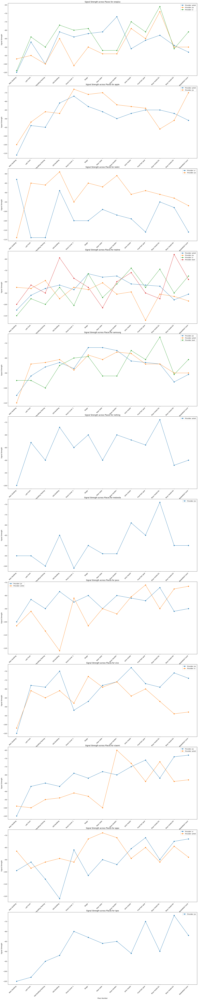

In [28]:
import pandas as pd
import matplotlib.pyplot as plt

unique_companies = data['manufacturer_parent_company_of_your_mobile'].unique()

# Set up the subplots
fig, axs = plt.subplots(len(unique_companies), 1, figsize=(20, 8 * len(unique_companies)))
fig.tight_layout(pad=5.0)

# Iterate over each manufacturer company and create a plot
for i, company in enumerate(unique_companies):
    filtered_data = data[data['manufacturer_parent_company_of_your_mobile'] == company]

    # Plotting for each service provider within the company
    ax = axs[i] if len(unique_companies) > 1 else axs  # Adjust subplot indexing if there's only one company
    for provider in filtered_data['service_provider_1'].unique():
        provider_data = filtered_data[filtered_data['service_provider_1'] == provider]
        signal_strength = [provider_data[f'signal_strength_for_place_{i}'].values[0] for i in range(1, 14)]

        # Plot each provider's data
        ax.plot(range(1, 14), signal_strength, marker='o', label=f'Provider: {provider}')

    # Set labels and title for each subplot
    ax.set_xlabel("Place Number")
    ax.set_ylabel("Signal Strength")
    ax.set_title(f"Signal Strength across Places for {company}")
    ax.set_xticks(range(1, 14))
    ax.set_xticklabels(place_names, rotation=45, ha='right')
    ax.legend()

plt.show()


A heatmap is generated to compare average signal strength across various models and locations. Data is organized into a pivot table, calculating the mean signal strength for each model at each place and visualizing it with annotated values and color intensity.








<ipython-input-31-b6e860b02560>:6: FutureWarning: The provided callable <function mean at 0x7dd7db3895a0> is currently using DataFrameGroupBy.mean. In a future version of pandas, the provided callable will be used directly. To keep current behavior pass the string "mean" instead.
  heatmap_data = data.pivot_table(values=place_cols, index='model_name', aggfunc=np.mean)


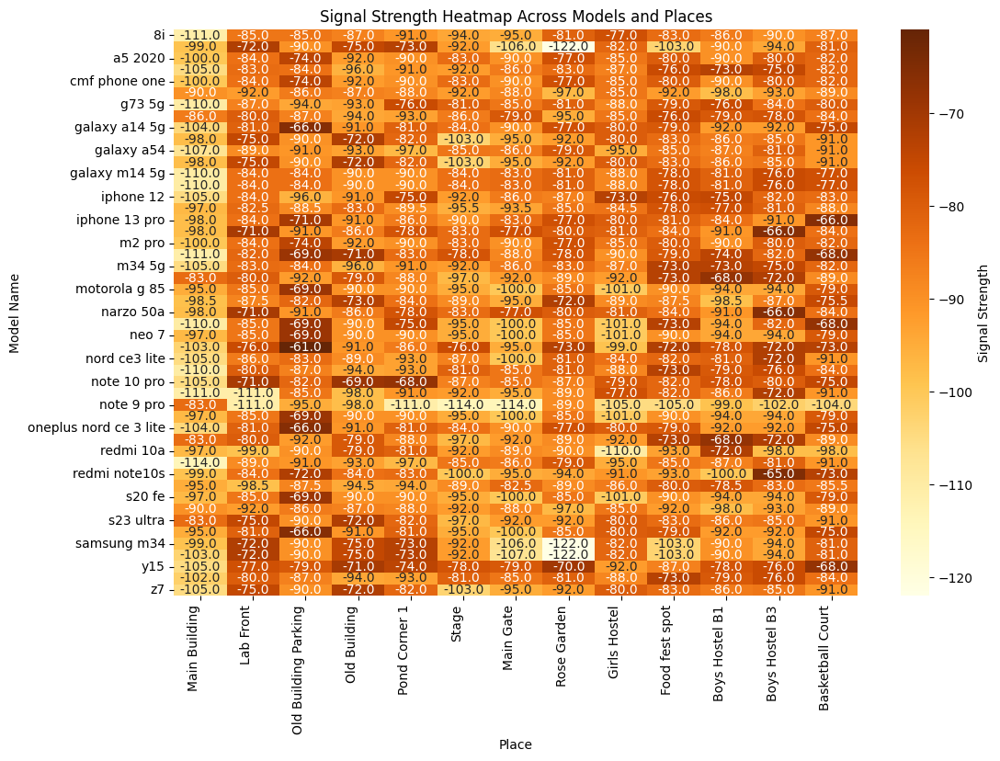

In [31]:
import seaborn as sns
import numpy as np

# Preparing data for heatmap
place_cols = [f'signal_strength_for_place_{i}' for i in range(1, 14)]
heatmap_data = data.pivot_table(values=place_cols, index='model_name', aggfunc=np.mean)
heatmap_data.columns = place_names

# Plotting heatmap
plt.figure(figsize=(12, 8))
sns.heatmap(heatmap_data, annot=True, fmt=".1f", cmap="YlOrBr", cbar_kws={'label': 'Signal Strength'})
plt.xlabel("Place")
plt.ylabel("Model Name")
plt.xticks(rotation=90, ha='right')
plt.title("Signal Strength Heatmap Across Models and Places")
plt.show()


### 2. Signal strength by location
Analyze signal strength variations by location to assess performance differences across areas.








In [33]:
import pandas as pd
import folium
import re

# Convert DMS to decimal degrees
def dms_to_decimal(dms_str):
    parts = re.split('[°\'"]+', dms_str)
    degrees = float(parts[0])
    minutes = float(parts[1])
    seconds = float(parts[2])
    decimal = degrees + minutes / 60 + seconds / 3600
    if 'S' in dms_str or 'W' in dms_str:
        decimal = -decimal
    return decimal

# Prepare data for latitude, longitude, and signal strength
location_data = {
    'latitude': [dms_to_decimal(my_data[f'latitude_of_place_{i}']) for i in range(1, 14)],
    'longitude': [dms_to_decimal(my_data[f'longitude_of_place_{i}']) for i in range(1, 14)],
    'signal_strength': [my_data[f'signal_strength_for_place_{i}'] for i in range(1, 14)],
    'place_name': place_names
}

# Convert data into a DataFrame
location_df = pd.DataFrame(location_data).dropna()

# Initialize map centered around the mean location
m = folium.Map(location=[location_df['latitude'].mean(), location_df['longitude'].mean()], zoom_start=18)

# Add points with color-coding by signal strength
for _, row in location_df.iterrows():
    folium.CircleMarker(
        location=[row['latitude'], row['longitude']],
        radius=7,
        color='black',
        fill=True,
        fill_color='green' if row['signal_strength'] > -80 else 'red',
        fill_opacity=0.7,
        tooltip=(
            f"Place: {row['place_name']}<br>"
            f"Signal Strength: {row['signal_strength']}"
        )
    ).add_to(m)

m

# 3. Signal strength distribution

Examine the distribution of signal strength to understand its range and variability.

### 3.1 Box plot for strength distribution according to the service provider
A box plot is a graphical representation that displays the distribution of a dataset through its quartiles, highlighting the median, interquartile range (IQR), and potential outliers. It provides a concise view of the data's spread, central tendency, and variability.

For signal strength distribution according to the service provider, a box plot can be used to compare the range, median, and variability of signal strengths across different providers, while also identifying any potential outliers in the data.

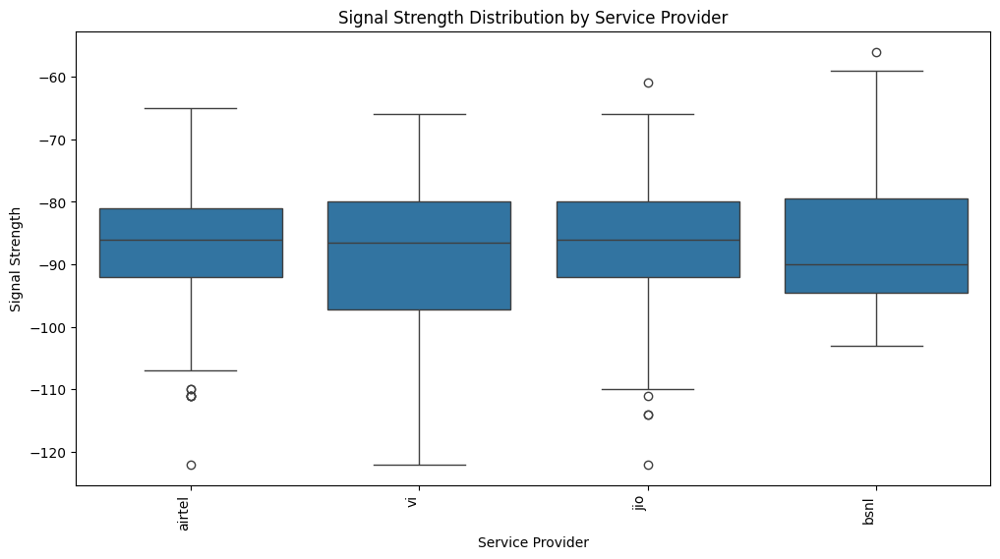

In [36]:
import matplotlib.pyplot as plt
import seaborn as sns

# Melt data to have a clean format for box plot
signal_cols = [f'signal_strength_for_place_{i}' for i in range(1, 14)]
melted_data = data.melt(id_vars=['service_provider_1'], value_vars=signal_cols,
                      var_name='Place', value_name='Signal Strength')

# Plot boxplot grouped by service provider
plt.figure(figsize=(12, 6))
sns.boxplot(data=melted_data, x='service_provider_1', y='Signal Strength')
plt.xlabel("Service Provider")
plt.ylabel("Signal Strength")
plt.xticks(rotation=90, ha='right')
plt.title("Signal Strength Distribution by Service Provider")
plt.show()


### 3.2 Violin plot grouped by service provider
A violin plot combines aspects of a box plot and a kernel density plot, providing a visualization of the distribution of data across different categories, showing the probability density and data spread. It offers a more detailed view of the distribution's shape compared to a box plot.

For signal strength distribution grouped by service provider, a violin plot can show the distribution of signal strengths for each provider, highlighting both the density and spread of the data, as well as any variations in distribution patterns across providers.

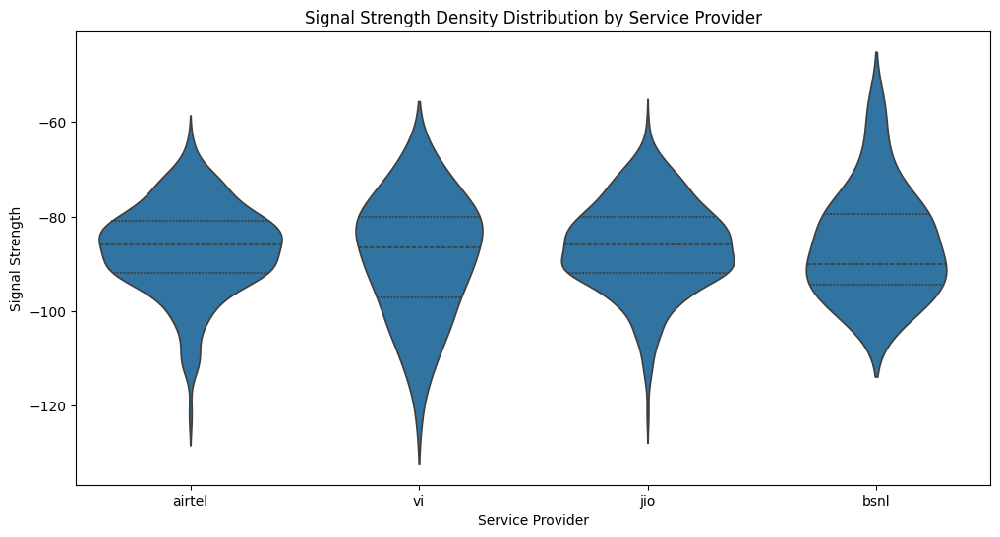

In [37]:
plt.figure(figsize=(12, 6))
sns.violinplot(data=melted_data, x='service_provider_1', y='Signal Strength', inner="quartile")
plt.xlabel("Service Provider")
plt.ylabel("Signal Strength")
plt.title("Signal Strength Density Distribution by Service Provider")
plt.show()


# 4. ASU vs Signal Strength
Explore the relationship between ASU (Absolute Signal Unit) and signal strength to understand signal quality variations.

### 4.1 Scatter plot

Visualize the relationship between ASU and signal strength using a scatter plot to identify trends and correlations.

As it can be seen, there is a linear relationship between ASU and Signal strength, which can be demonstrated as a linear interpolation of one with the respect of the other.

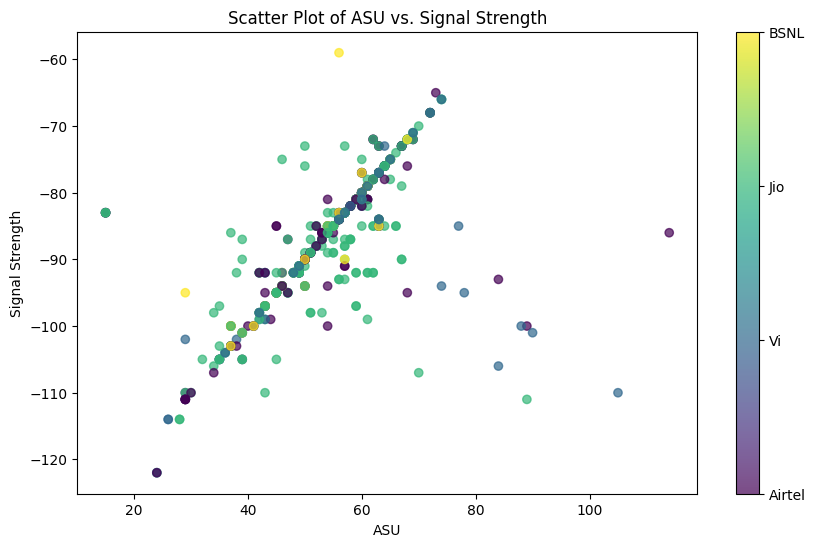

In [38]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

# Create a mapping for the service providers
provider_mapping = {'airtel': 0, 'vi': 1, 'jio': 2, 'bsnl': 3}

# Convert service provider names to numerical values
provider_data = data['service_provider_1'].map(provider_mapping).repeat(10).values

# Flatten data to pair ASU with corresponding Signal Strength
asu_cols = [f'asu_for_place_{i}' for i in range(1, 11)]
signal_cols = [f'signal_strength_for_place_{i}' for i in range(1, 11)]

asu_data = data[asu_cols].values.flatten()
signal_data = data[signal_cols].values.flatten()

# Plotting
plt.figure(figsize=(10, 6))
scatter = plt.scatter(asu_data, signal_data, c=provider_data, cmap='viridis', alpha=0.7)

# Adding color bar with labels for service providers
cbar = plt.colorbar(scatter)
cbar.set_ticks([0, 1, 2, 3])
cbar.set_ticklabels(['Airtel', 'Vi', 'Jio', 'BSNL'])

plt.xlabel("ASU")
plt.ylabel("Signal Strength")
plt.title("Scatter Plot of ASU vs. Signal Strength")
plt.show()


### 4.2 Joint plot
Use a joint plot to visualize the distribution and relationship between ASU and signal strength, showing both individual variable distributions and their correlation.

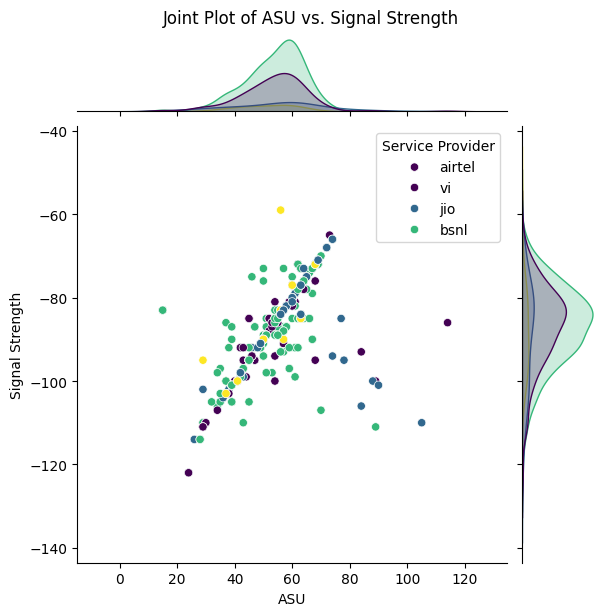

In [43]:
import seaborn as sns
import pandas as pd

# Prepare data for joint plot
joint_data = pd.DataFrame({'ASU': asu_data, 'Signal Strength': signal_data, 'Service Provider': provider_data})

# Plot joint plot with regression line
joint_plot = sns.jointplot(data=joint_data, x='ASU', y='Signal Strength', hue="Service Provider", palette="viridis")
joint_plot.ax_joint.legend(title="Service Provider", labels=list(provider_mapping.keys()), bbox_to_anchor=(1, 1))
plt.suptitle("Joint Plot of ASU vs. Signal Strength", y=1.02)
plt.show()


# 5. Service Provider Comparison
Compare signal strength performance across different service providers to identify variability and trends.


### 5.1 Grouped bar chart between signal strength and service provider
Compare average signal strength for each service provider across multiple places.

<ipython-input-46-98265a503838>:17: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.barplot(data=melted_data, x='Place', y='Signal Strength', hue='service_provider_1', ci=None)


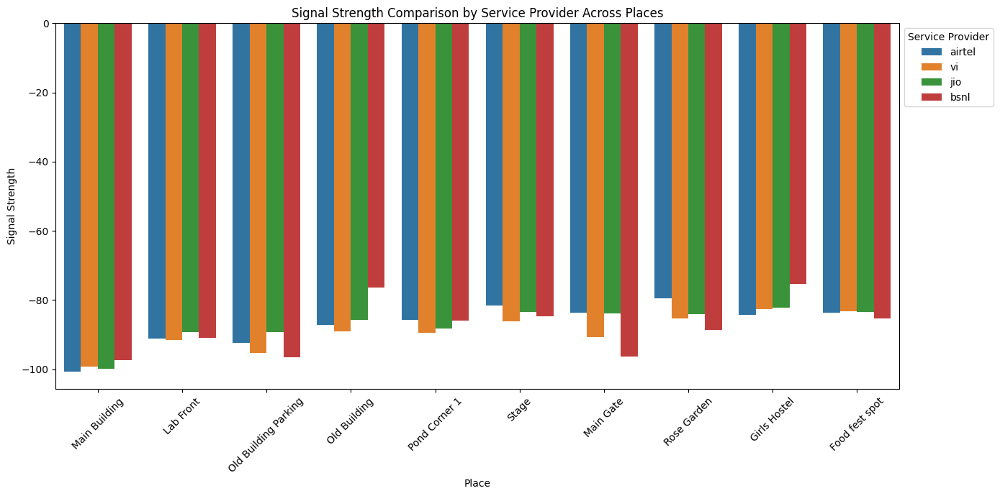

In [46]:
import pandas as pd
import matplotlib.pyplot as plt

# Prepare data by reshaping it for a grouped bar chart
place_cols = [f'signal_strength_for_place_{i}' for i in range(1, 11)]
provider_cols = ['service_provider_1', 'service_provider_2']

# Melt the data for better plotting
melted_data = pd.melt(data, id_vars=provider_cols, value_vars=place_cols,
                      var_name='Place', value_name='Signal Strength')

place_mapping = dict(zip(place_cols, place_names))
melted_data['Place'] = melted_data['Place'].map(place_mapping)

# Create the plot
plt.figure(figsize=(14, 7))
sns.barplot(data=melted_data, x='Place', y='Signal Strength', hue='service_provider_1', ci=None)

# Customize the plot
plt.title("Signal Strength Comparison by Service Provider Across Places")
plt.xlabel("Place")
plt.ylabel("Signal Strength")
plt.legend(title='Service Provider', bbox_to_anchor=(1, 1))
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


### 5.2 Stacked Area Plot
Visualize how each service provider’s signal strength changes across all locations.

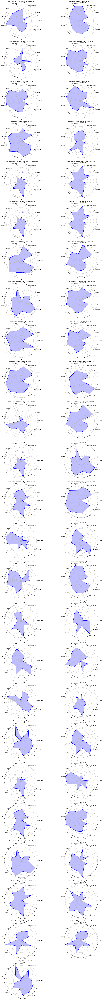

In [50]:
import numpy as np
import matplotlib.pyplot as plt
from math import pi

models = data['model_name'].unique()
num_models = len(models)
cols = 2
rows = (num_models // cols) + (num_models % cols)

fig, axes = plt.subplots(rows, cols, figsize=(20, 6 * rows), subplot_kw=dict(polar=True))
axes = axes.flatten()

for i, model_name in enumerate(models):
    filtered_data = data[data['model_name'] == model_name]

    if filtered_data.empty:
        signal_strength = [0] * 14
    else:
        signal_strength = []
        for j in range(1, 14):
            col_name = f'signal_strength_for_place_{j}'
            if col_name in filtered_data.columns:
                signal_strength.append(filtered_data[col_name].values[0])
            else:
                signal_strength.append(0)

    places = [f'Place_{i}' for i in range(1, 14)]
    angles = np.linspace(0, 2 * np.pi, len(places), endpoint=False).tolist()
    signal_strength += signal_strength[:1]
    angles += angles[:1]
    ax = axes[i]

    ax.fill(angles, signal_strength, color='blue', alpha=0.25)
    ax.plot(angles, signal_strength, color='blue', linewidth=2)

    ax.set_yticklabels([])
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(place_names)

    ax.set_title(f"Radar Chart of Signal Strength for {model_name}", size=12)

for i in range(num_models, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()


# 6. Signal Strength Over Device Model
Analyze how signal strength varies across device models to assess performance differences.

### 6.1 Box Plot by Manufacturer
Display the range and median of signal strength for few models to observe performance variability.

<ipython-input-66-213d40e9e9eb>:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(


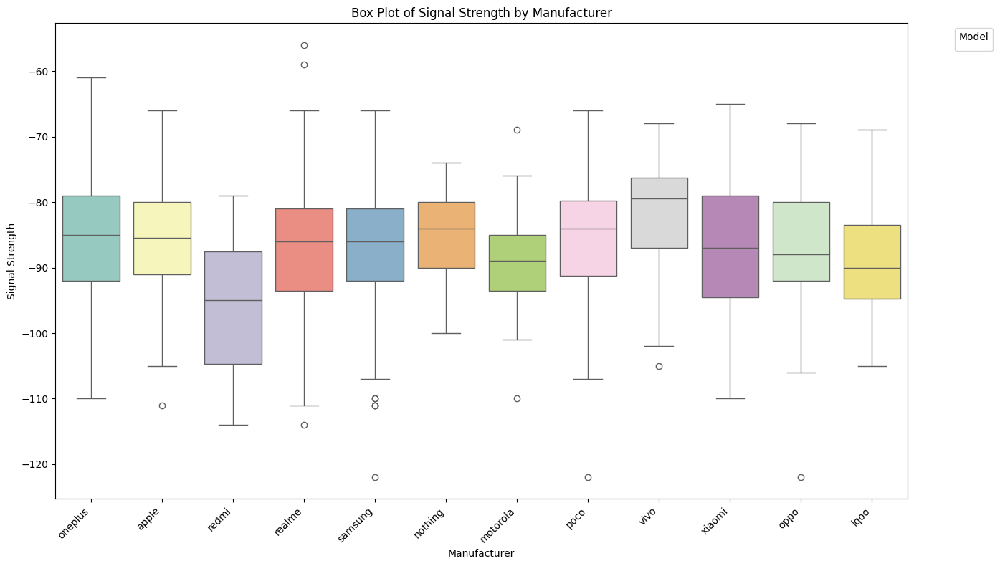

In [66]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Define signal strength columns
place_cols = [f'signal_strength_for_place_{i}' for i in range(1, 14)]

# Melt data to make it long-form for plotting
melted_data = pd.melt(data, id_vars=['manufacturer_parent_company_of_your_mobile'],
                      value_vars=place_cols, var_name='Place', value_name='Signal Strength')

# Create a box plot
plt.figure(figsize=(14, 8))
sns.boxplot(
    data=melted_data,
    x='manufacturer_parent_company_of_your_mobile',
    y='Signal Strength',
    palette='Set3'
)

# Customize the plot
plt.title("Box Plot of Signal Strength by Manufacturer")
plt.xlabel("Manufacturer")
plt.ylabel("Signal Strength")
plt.legend(title="Model", bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()

# Display the plot
plt.show()

### 6.2 Heatmap of Models vs. Service Providers
Display average signal strength per model and service provider to find consistent or outperforming combinations.

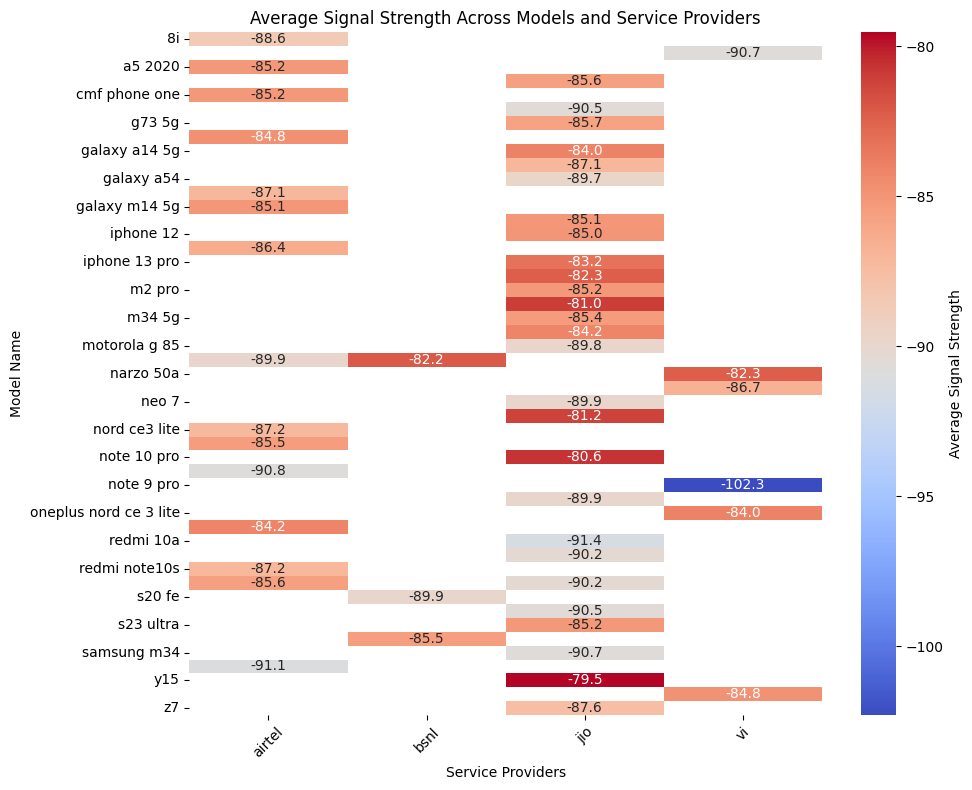

In [63]:
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt

# Service providers and signal strength columns
provider_cols = ['service_provider_1']
place_cols = [f'signal_strength_for_place_{i}' for i in range(1, 14)]

# Melt data to make it long-form for aggregation
melted_data = pd.melt(data, id_vars=['model_name'] + provider_cols, value_vars=place_cols,
                      var_name='Place', value_name='Signal Strength')

# Group by model name and service provider, and calculate the mean signal strength
avg_signal_strength = (
    melted_data.groupby(['model_name', 'service_provider_1'])['Signal Strength']
    .mean()
    .reset_index()
)

# Pivot to create a DataFrame suitable for a heatmap
heatmap_data = avg_signal_strength.pivot_table(
    values='Signal Strength',
    index='model_name',
    columns='service_provider_1',
    aggfunc='mean'
)

# Plot the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(
    heatmap_data,
    annot=True,
    fmt=".1f",
    cmap="coolwarm",
    cbar_kws={'label': 'Average Signal Strength'}
)
plt.title("Average Signal Strength Across Models and Service Providers")
plt.xlabel("Service Providers")
plt.ylabel("Model Name")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Summary

The ad hoc survey data analysis project focused on evaluating mobile signal strength across different models, manufacturers, and service providers at various locations. The data underwent comprehensive cleaning and preprocessing to address missing values, standardize format inconsistencies, and handle outliers. Key transformations included standardizing geolocation data, consolidating manufacturer names, and encoding signal metrics to improve comparability.


## Key Findings:

**Signal Strength Variability by Manufacturer and Model:** The analysis showed substantial variability in signal strength across different mobile manufacturers and models. A heatmap of signal strength across models revealed that certain models consistently outperformed others in maintaining signal quality across multiple locations, indicating model-specific hardware or network compatibility differences.

**Service Provider Performance:** Among service providers, Airtel, Vi, Jio, and BSNL were compared. Box plots highlighted the differences in signal strength distributions, with Airtel and Jio generally displaying stronger signal strength across locations, whereas BSNL showed lower consistency. Violin plots confirmed that Airtel and Jio had tighter distributions around higher signal strengths, reflecting more reliable performance.

**Location-Based Signal Strength:** The project included a location analysis using latitude and longitude data, visualized with folium maps to show signal strength variations by location. Locations with strong signals were visually distinguished, highlighting urban or high-traffic areas where network providers focus coverage.

**Correlation Between ASU and Signal Strength:** A linear relationship was observed between ASU (Absolute Signal Unit) and signal strength, indicating ASU as a reliable proxy for signal quality. This relationship was verified through scatter and joint plots, further validating the data’s consistency and analytical accuracy.

**Service Provider and Model Combination Effects:** Analysis identified optimal combinations of device models and service providers that achieved the best signal performance, suggesting valuable insights for consumer recommendations and network improvements.

These findings can inform decisions for network optimization, provide guidance for consumers in selecting devices and networks, and highlight areas for service providers to improve coverage.

# Conclusion

This ad hoc survey data analysis provides a thorough understanding of mobile signal performance across devices, locations, and service providers. By revealing critical data patterns, the analysis supports data-driven decisions for both users and network providers, contributing to optimized connectivity and improved user experiences.
